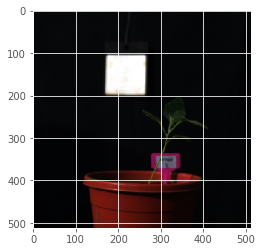

This function has been updated to include object hierarchy so object holes can be included


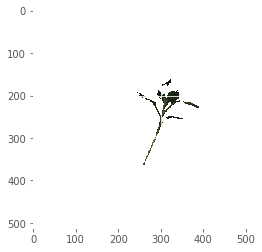

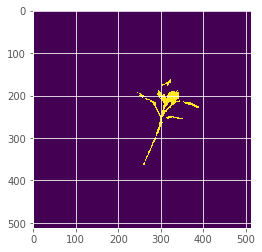

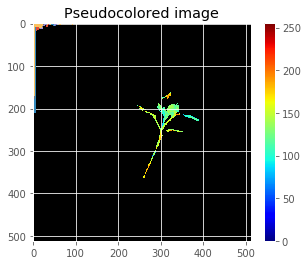

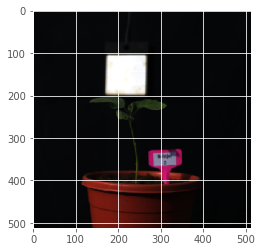

This function has been updated to include object hierarchy so object holes can be included


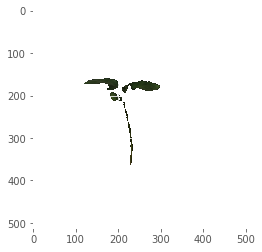

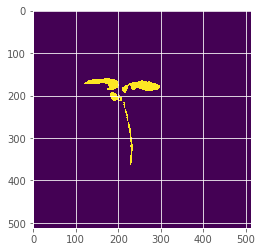

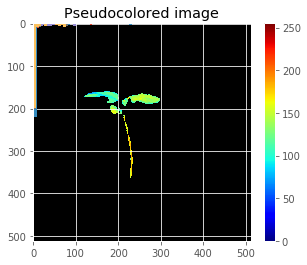

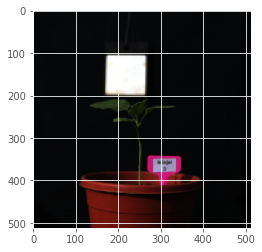

This function has been updated to include object hierarchy so object holes can be included


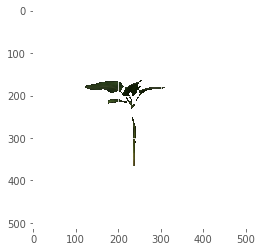

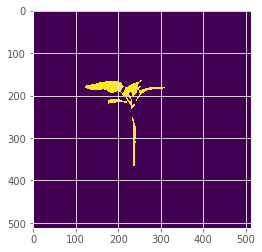

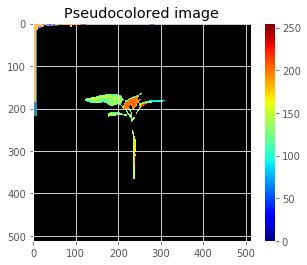

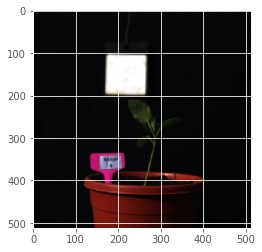

This function has been updated to include object hierarchy so object holes can be included


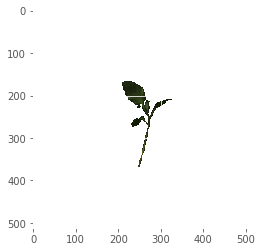

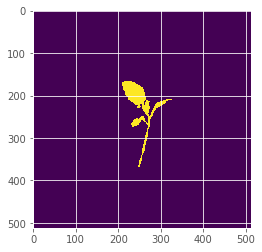

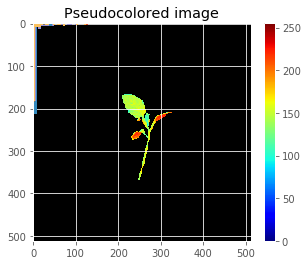

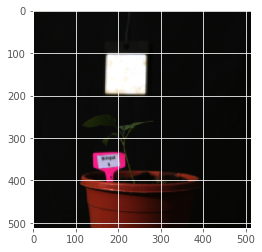

This function has been updated to include object hierarchy so object holes can be included


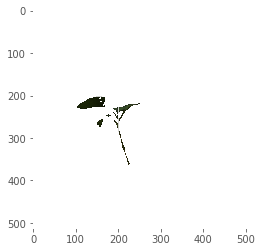

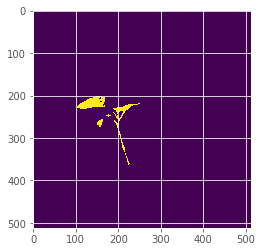

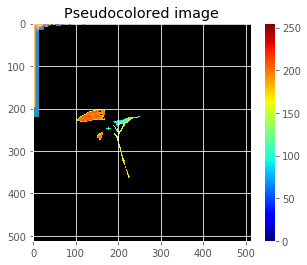

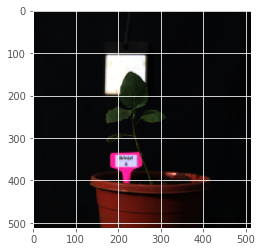

This function has been updated to include object hierarchy so object holes can be included


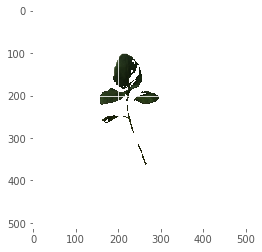

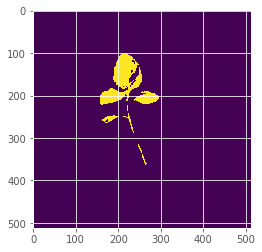

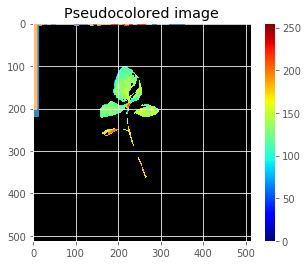

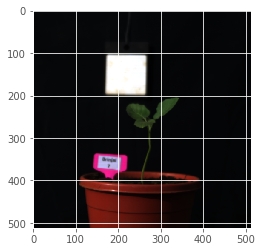

This function has been updated to include object hierarchy so object holes can be included


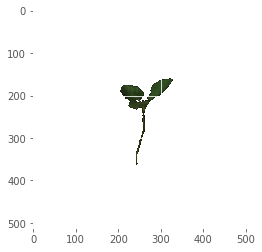

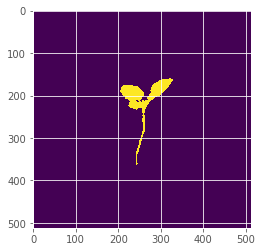

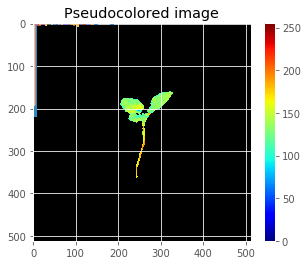

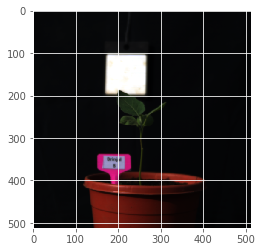

This function has been updated to include object hierarchy so object holes can be included


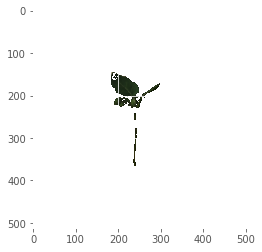

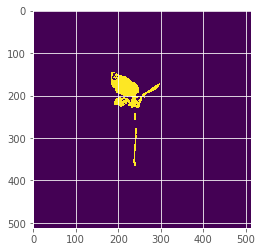

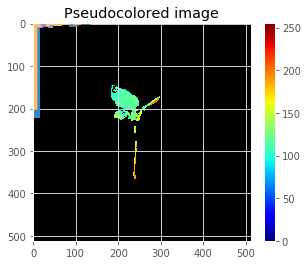

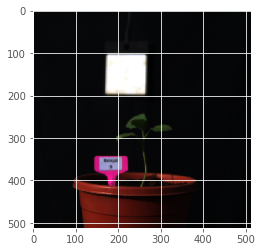

This function has been updated to include object hierarchy so object holes can be included


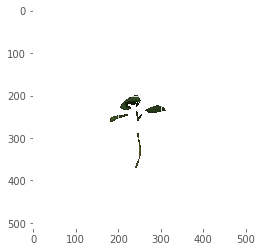

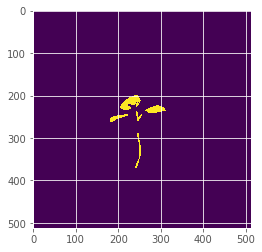

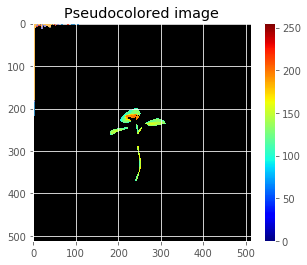

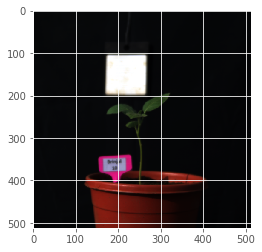

This function has been updated to include object hierarchy so object holes can be included


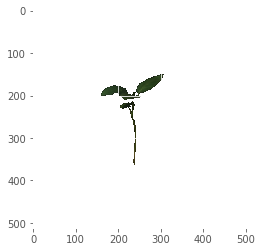

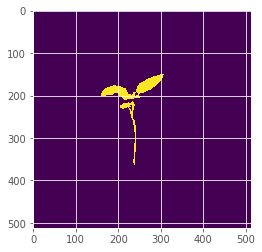

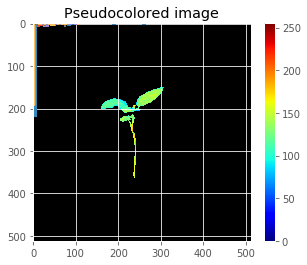

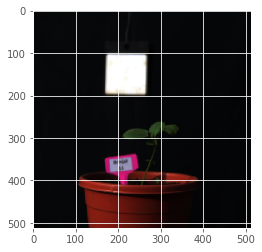

This function has been updated to include object hierarchy so object holes can be included


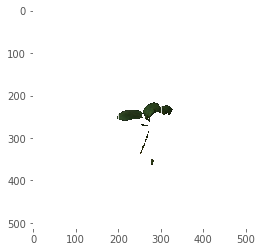

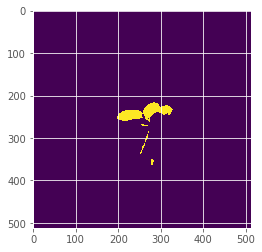

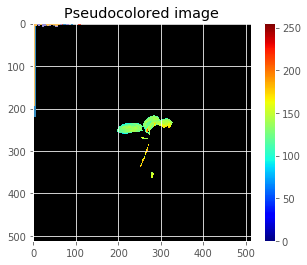

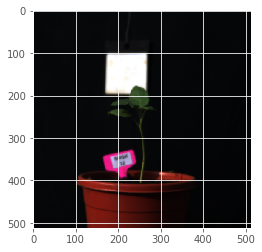

This function has been updated to include object hierarchy so object holes can be included


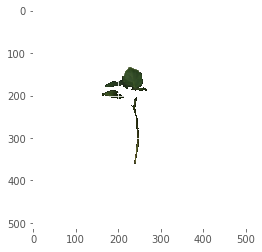

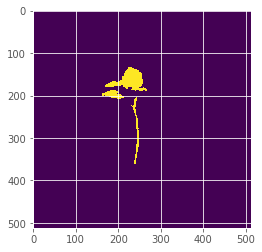

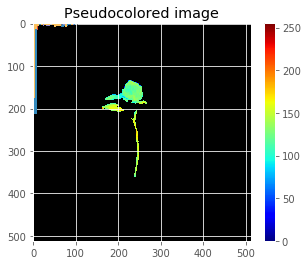

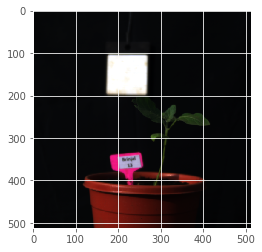

This function has been updated to include object hierarchy so object holes can be included


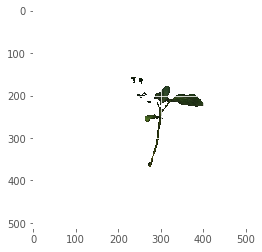

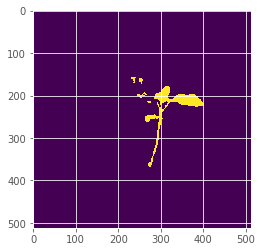

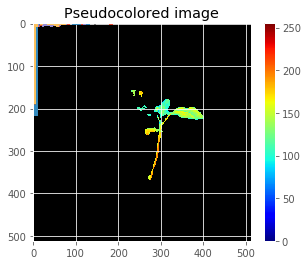

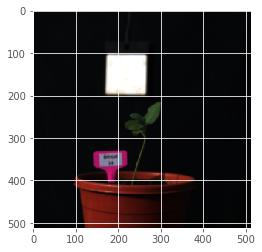

This function has been updated to include object hierarchy so object holes can be included


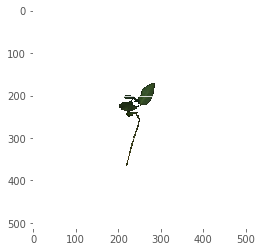

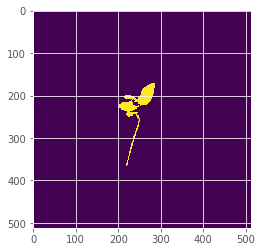

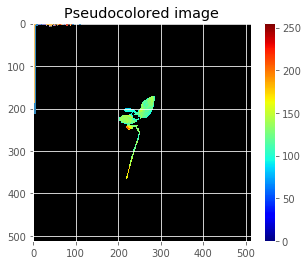

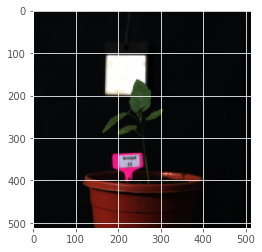

This function has been updated to include object hierarchy so object holes can be included


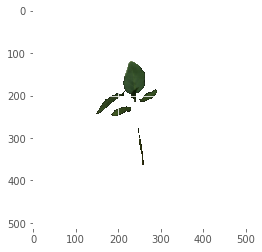

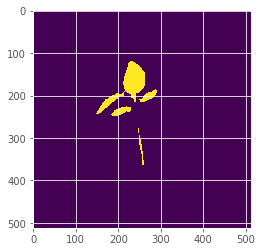

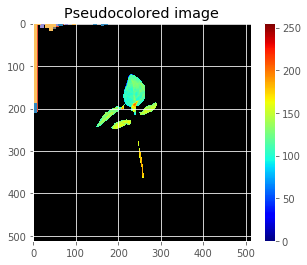

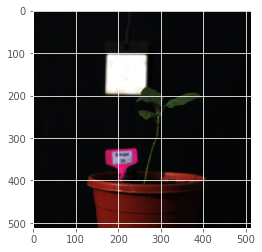

This function has been updated to include object hierarchy so object holes can be included


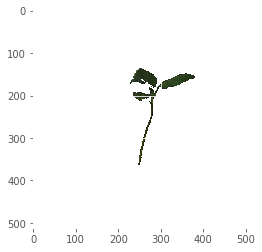

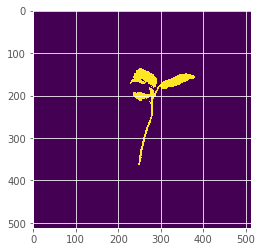

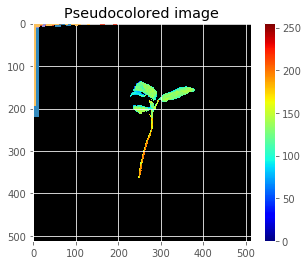

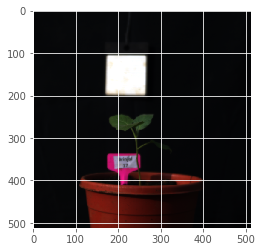

This function has been updated to include object hierarchy so object holes can be included


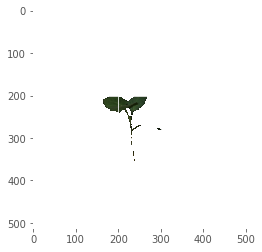

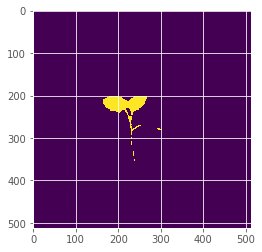

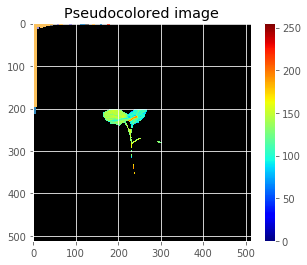

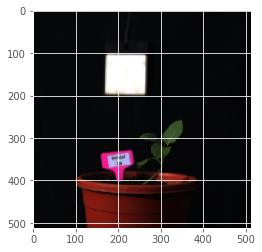

This function has been updated to include object hierarchy so object holes can be included


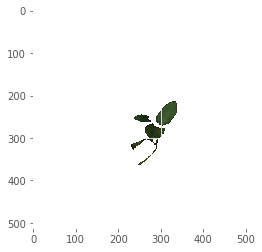

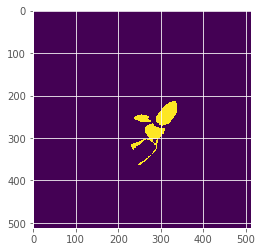

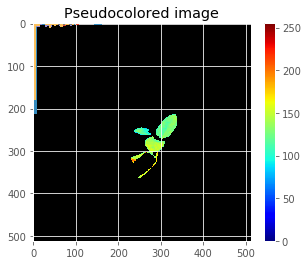

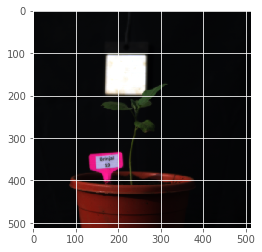

This function has been updated to include object hierarchy so object holes can be included


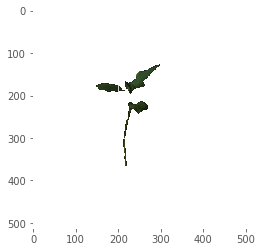

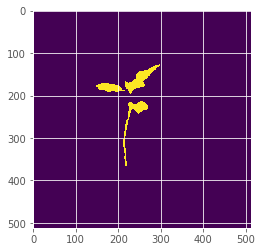

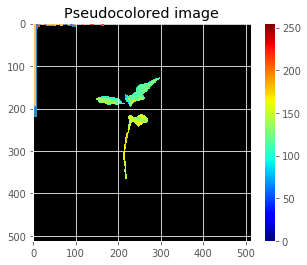

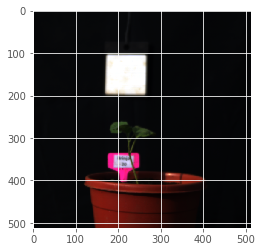

This function has been updated to include object hierarchy so object holes can be included


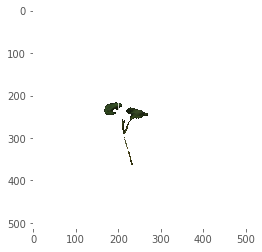

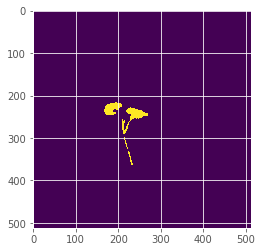

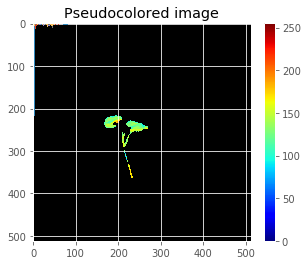

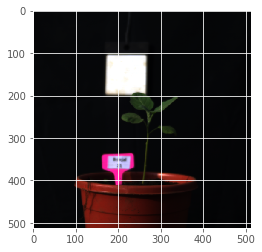

This function has been updated to include object hierarchy so object holes can be included


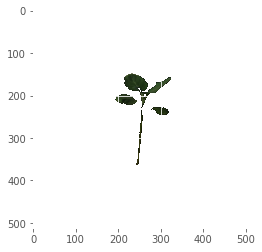

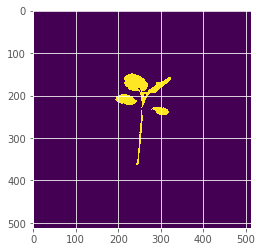

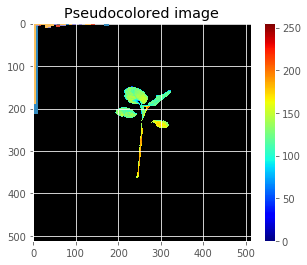

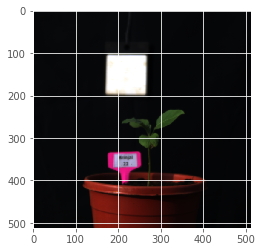

This function has been updated to include object hierarchy so object holes can be included


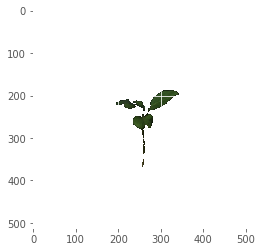

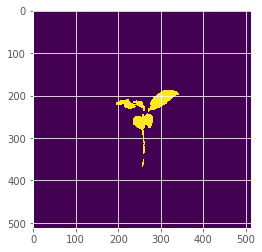

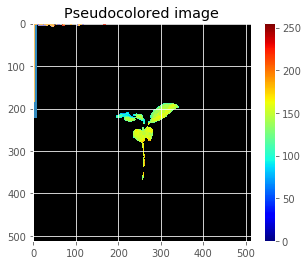

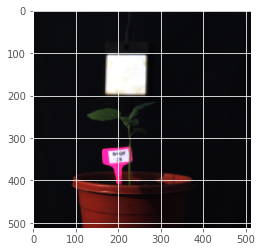

This function has been updated to include object hierarchy so object holes can be included


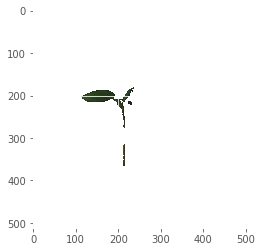

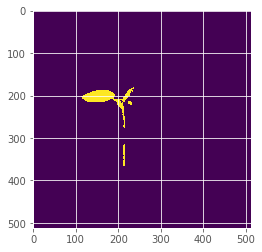

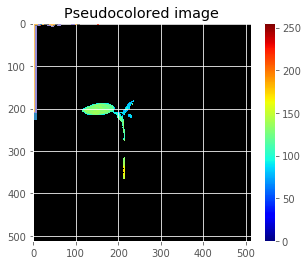

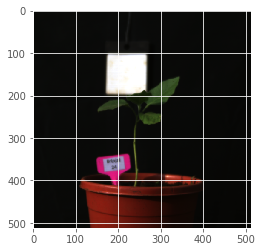

This function has been updated to include object hierarchy so object holes can be included


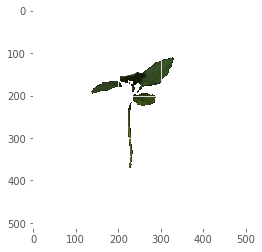

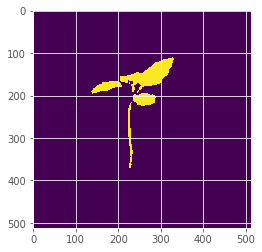

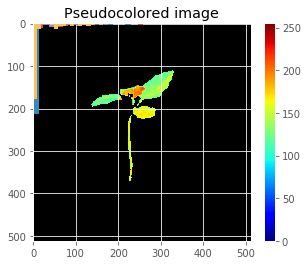

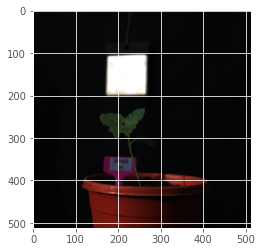

This function has been updated to include object hierarchy so object holes can be included


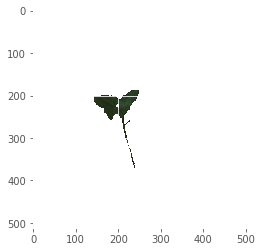

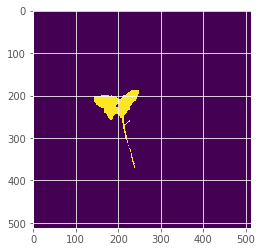

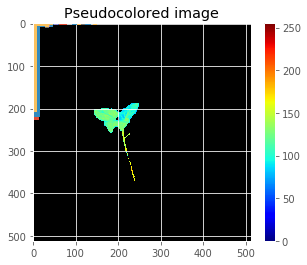

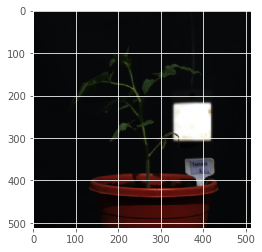

This function has been updated to include object hierarchy so object holes can be included


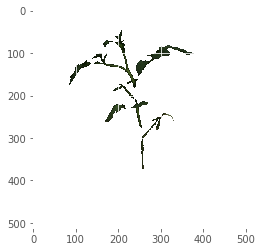

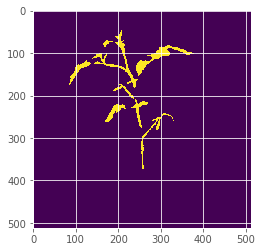

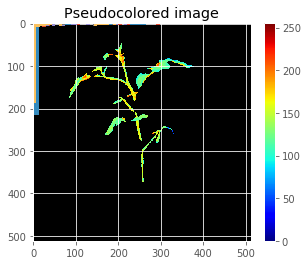

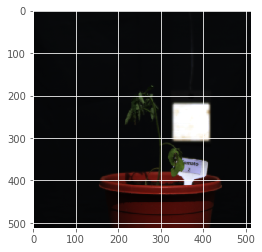

This function has been updated to include object hierarchy so object holes can be included


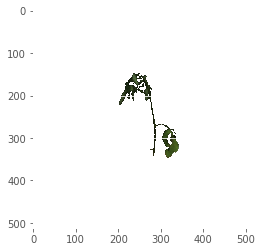

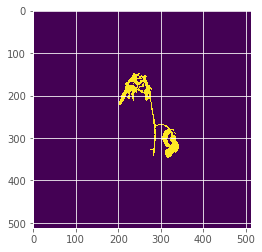

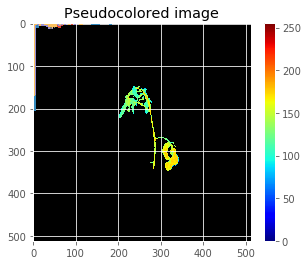

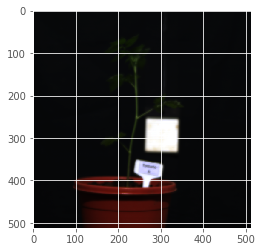

This function has been updated to include object hierarchy so object holes can be included


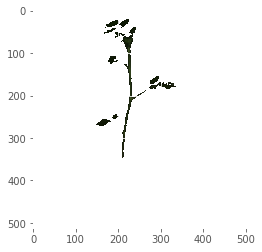

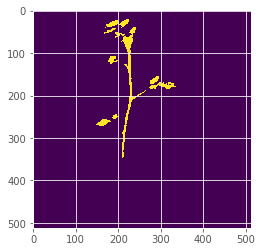

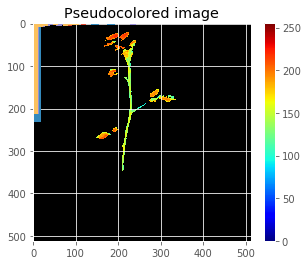

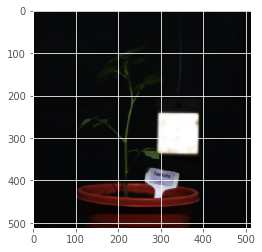

This function has been updated to include object hierarchy so object holes can be included


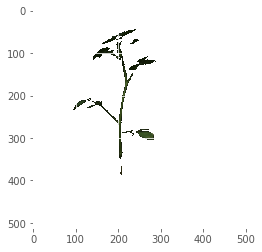

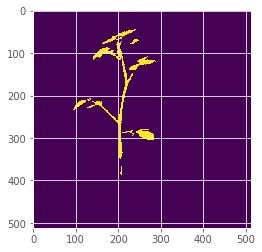

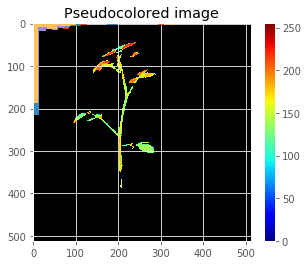

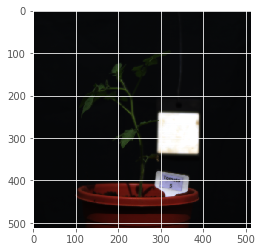

This function has been updated to include object hierarchy so object holes can be included


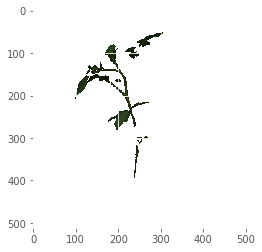

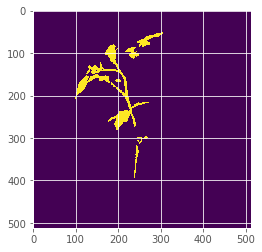

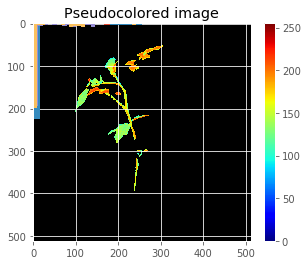

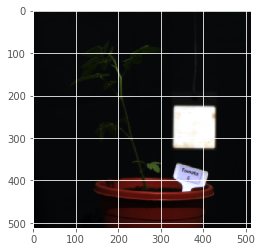

This function has been updated to include object hierarchy so object holes can be included


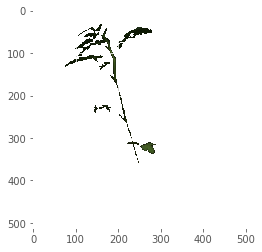

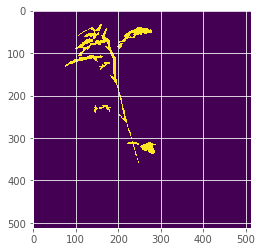

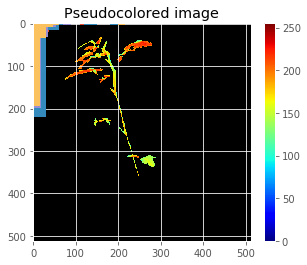

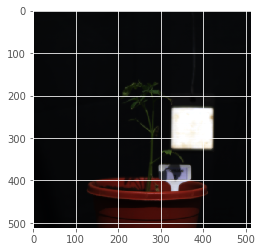

This function has been updated to include object hierarchy so object holes can be included


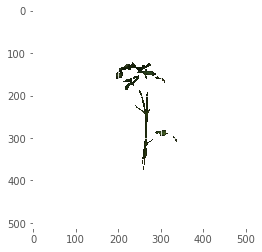

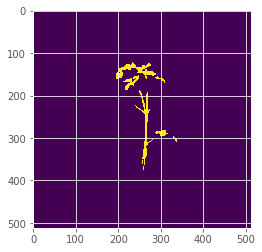

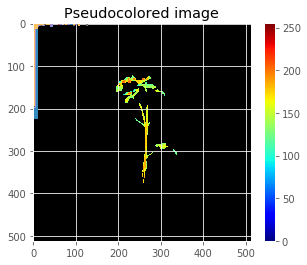

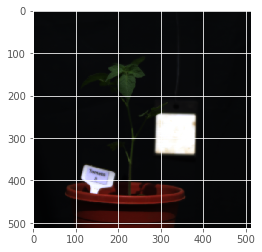

This function has been updated to include object hierarchy so object holes can be included


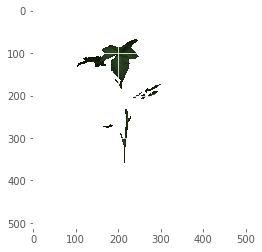

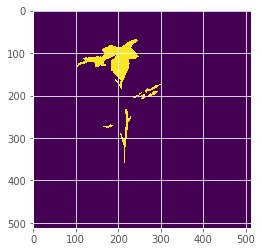

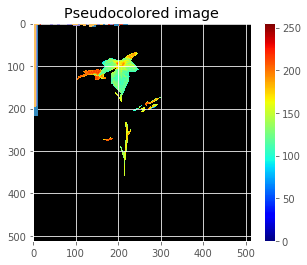

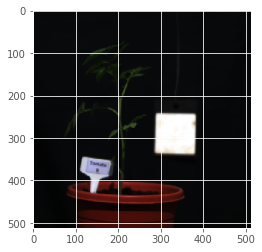

This function has been updated to include object hierarchy so object holes can be included


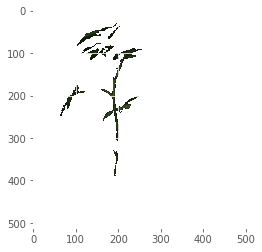

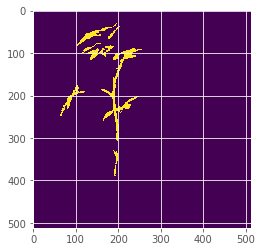

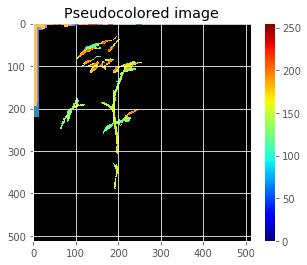

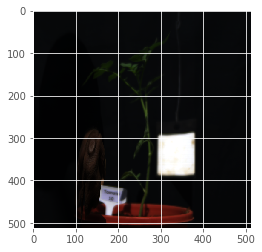

This function has been updated to include object hierarchy so object holes can be included


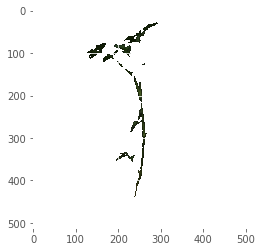

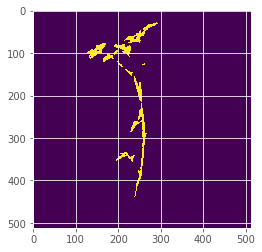

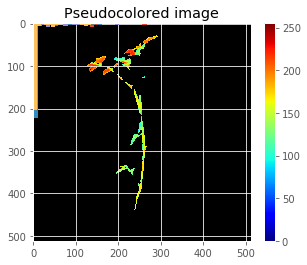

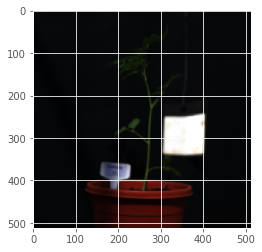

This function has been updated to include object hierarchy so object holes can be included


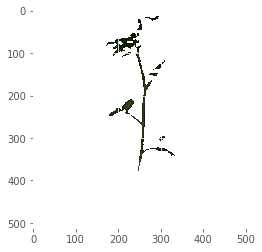

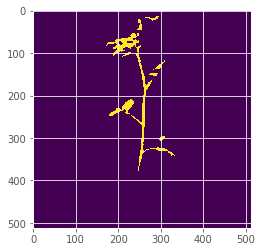

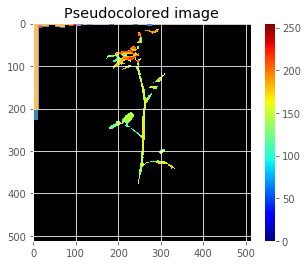

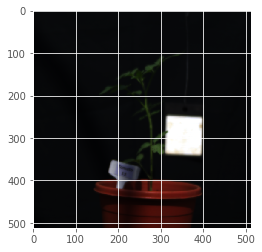

This function has been updated to include object hierarchy so object holes can be included


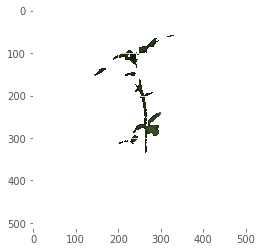

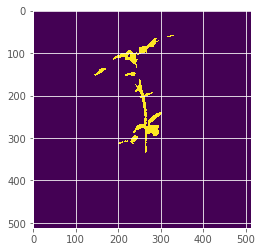

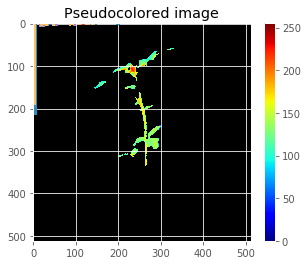

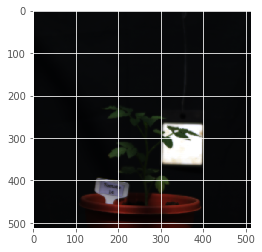

This function has been updated to include object hierarchy so object holes can be included


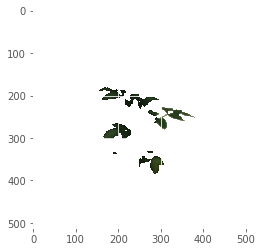

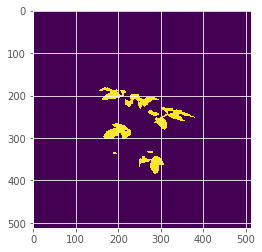

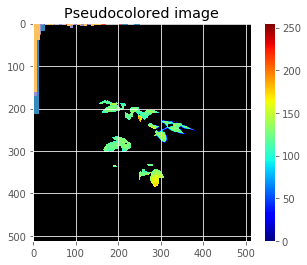

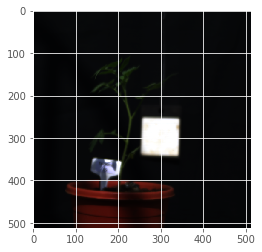

This function has been updated to include object hierarchy so object holes can be included


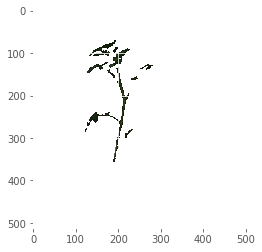

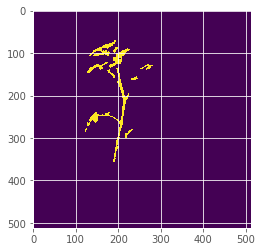

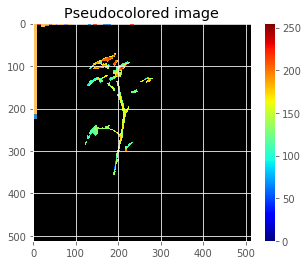

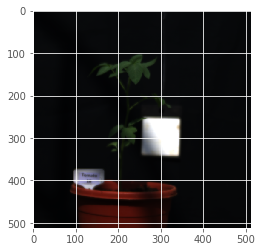

This function has been updated to include object hierarchy so object holes can be included


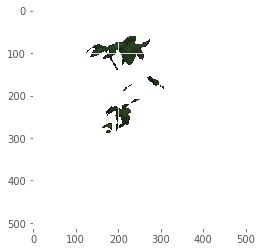

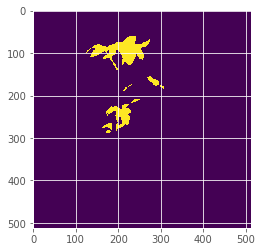

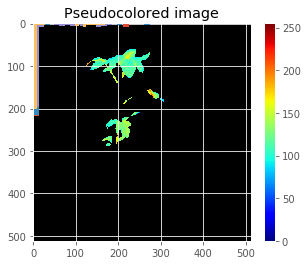

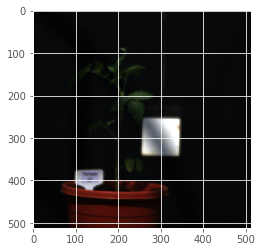

This function has been updated to include object hierarchy so object holes can be included


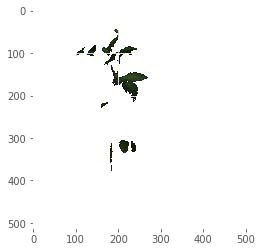

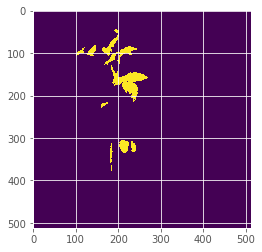

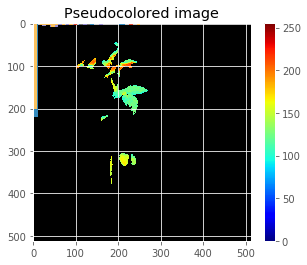

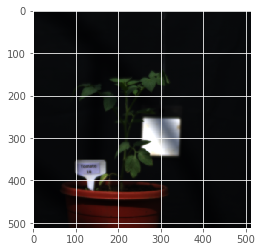

This function has been updated to include object hierarchy so object holes can be included


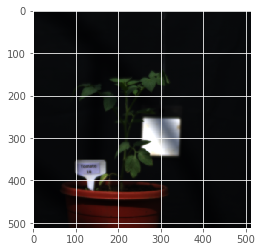

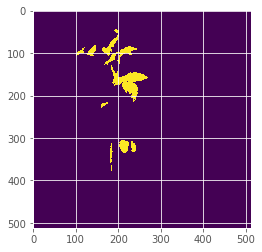

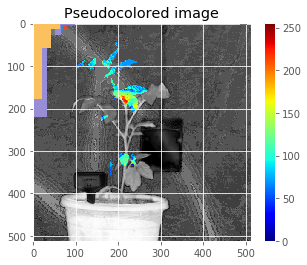

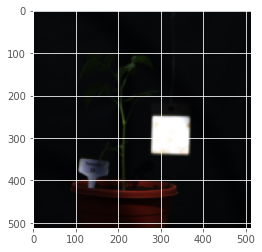

This function has been updated to include object hierarchy so object holes can be included


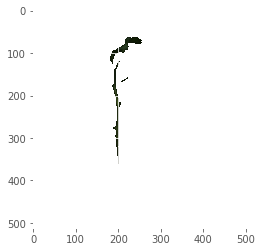

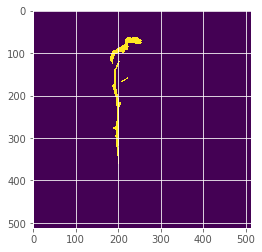

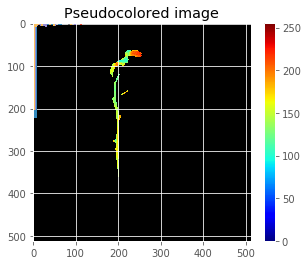

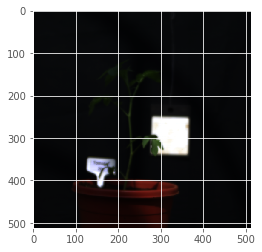

This function has been updated to include object hierarchy so object holes can be included


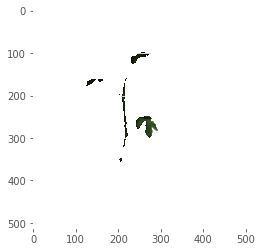

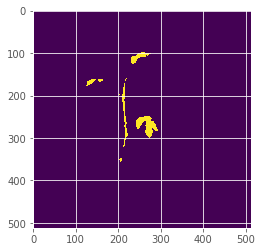

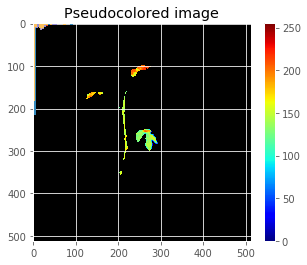

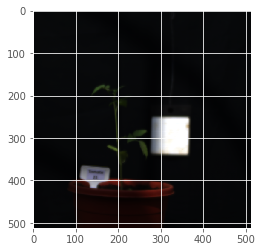

This function has been updated to include object hierarchy so object holes can be included


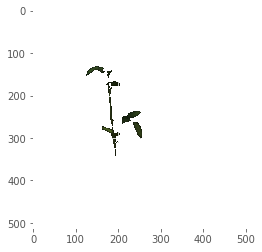

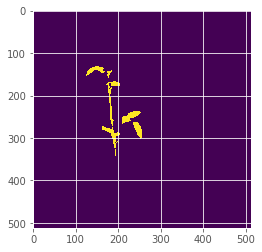

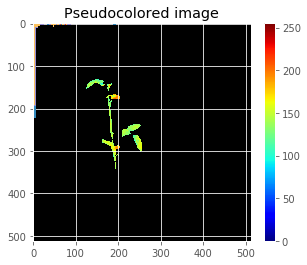

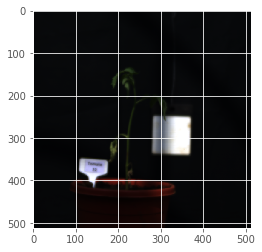

This function has been updated to include object hierarchy so object holes can be included


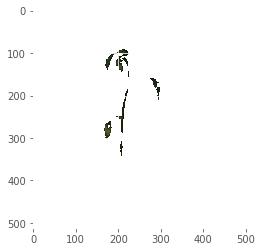

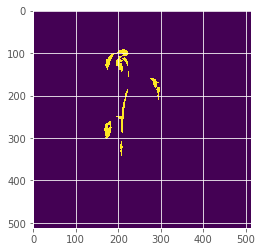

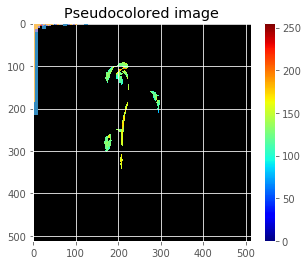

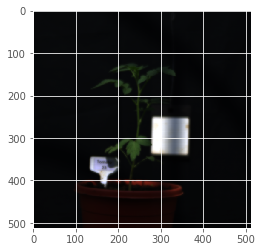

This function has been updated to include object hierarchy so object holes can be included


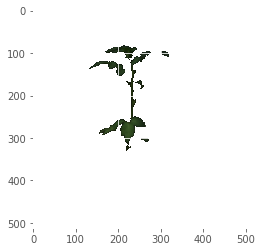

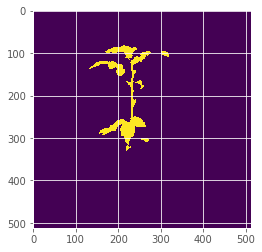

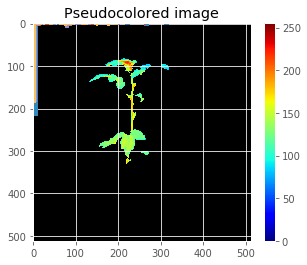

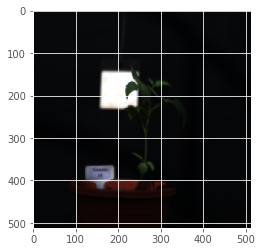

This function has been updated to include object hierarchy so object holes can be included


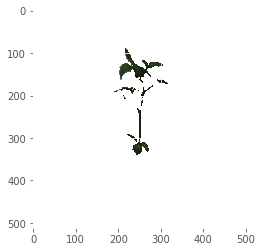

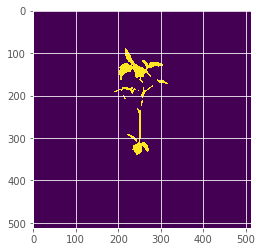

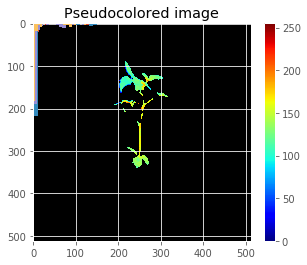

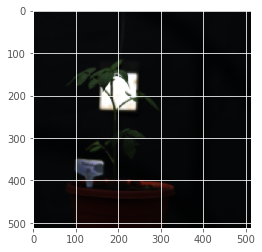

This function has been updated to include object hierarchy so object holes can be included


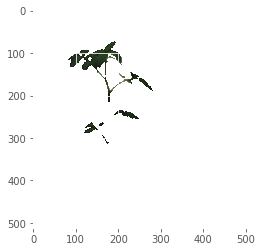

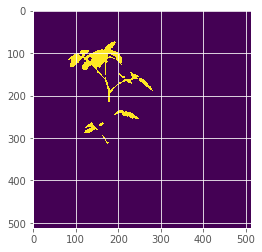

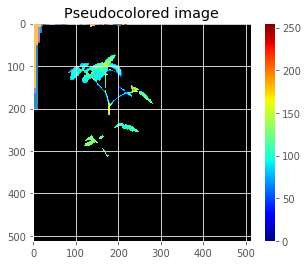

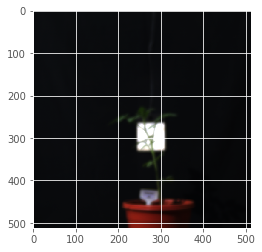

This function has been updated to include object hierarchy so object holes can be included


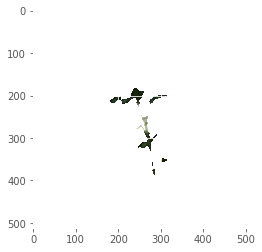

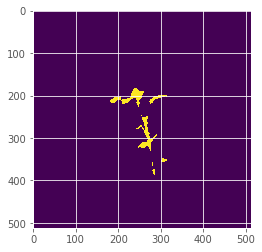

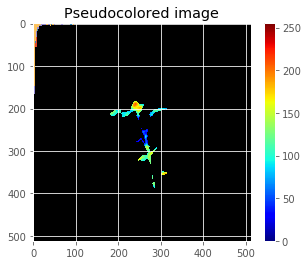

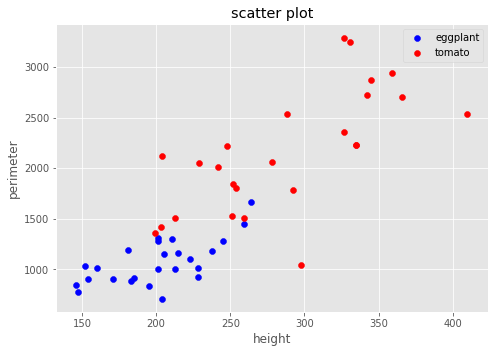

In [79]:
import sys, traceback
import cv2
import os
import re
import numpy as np
import argparse
import string
from plantcv import plantcv as pcv
import matplotlib.pyplot as plt
from numpy import array
import csv
%matplotlib inline
import pandas as pd
from scipy.stats import kurtosis
from scipy.stats import skew
import pandas as pd


path = 'C:/Users/Jhilik/Desktop/AICH/data/'
folder_name = os.listdir(path)
index = 0
egg = []
tom = []
egg1 = []
tom1 = []

for folder in folder_name:
    folder_path = path+folder+'/'
    file_list = os.listdir(folder_path)
    for file in file_list:
        if file[-3:]=='PNG' or file[-3:]=='png':
            
            file_path = folder_path + file
            
            #pcv.params.debug = "plot"

            #read in image
            img, ipath, img_filename = pcv.readimage(filename=file_path, mode="rgb")

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img)
            plt.show()

            # STEP 1: Check if this is a night image, for some of these dataset's images were captured
                # at night, even if nothing is visible. To make sure that images are not taken at
                # night we check that the image isn't mostly dark (0=black, 255=white).
                # if it is a night image it throws a fatal error and stops the workflow.

            #if np.average(img) < 50:
                    #pcv.fatal_error("Night Image")
            #else:
                    #pass

            # STEP 2: Normalize the white color so you can later
                # compare color between images.
                # Inputs:
                #   img = image object, RGB colorspace
                #   roi = region for white reference, if none uses the whole image,
                #         otherwise (x position, y position, box width, box height)

                # white balance image based on white toughspot
            img1 = pcv.white_balance(img, roi=None)

            # STEP 3: Rotate the image
                # Inputs:
                #   img = image object, RGB color space
                #   rotation_deg = Rotation angle in degrees, can be negative, positive values 
                #                  will move counter-clockwise 
                #   crop = If True then image will be cropped to original image dimensions, if False
                #          the image size will be adjusted to accommodate new image dimensions 
            rotate_img = pcv.rotate(img1, 0.5, True)

            # STEP 4: Shift image. This step is important for clustering later on.
                # For this image it also allows you to push the green raspberry pi camera
                # out of the image. This step might not be necessary for all images.
                # The resulting image is the same size as the original.
                # Inputs:
                #   img    = image object
                #   number = integer, number of pixels to move image
                #   side   = direction to move from "top", "bottom", "right","left"

            shift1 = pcv.shift_img(rotate_img, 45, "bottom")
            shift2 = pcv.shift_img(shift1, 15, "right")


            img1 = shift2

            # STEP 5: Convert image from RGB colorspace to LAB colorspace
                # Keep only the green-magenta channel (grayscale)
                # Inputs:
                #    rgb_img = image object, RGB colorspace
                #    channel = color subchannel ('l' = lightness, 'a' = green-magenta , 'b' = blue-yellow)

            lab = pcv.rgb2gray_lab(img1, 'a')

            # STEP 6: Set a binary threshold on the saturation channel image
                # Inputs:
                #    gray_img    = img object, grayscale
                #    threshold   = threshold value (0-255)
                #    max_value   = value to apply above threshold (usually 255 = white)
                #    object_type = 'light' or 'dark'
                #       - If object is light then standard thresholding is done
                #       - If object is dark then inverse thresholding is done

            img_binary = pcv.threshold.binary(gray_img=lab, threshold=120, max_value=255, object_type='dark')
            #                                                        ^
            #                                                        |
            #                                          adjust this value

            # STEP 7: Fill in small objects (speckles)
                # Inputs:
                #    bin_img  = image object, grayscale. img will be returned after filling
                #    size     = minimum object area size in pixels (integer)

            fill_image = pcv.fill(bin_img=img_binary, size=30)
                #                                           ^
                #                                           |
                #                           adjust this value

            # STEP 8: Dilate so that you don't lose leaves (just in case)
                # Inputs:
                #    gray_img = input image
                #    ksize    = kernel size, integer
                #    i        = iterations, i.e. number of consecutive filtering passes

            #dilated = pcv.dilate(fill_image, 2, 1)

            # STEP 9: Find objects (contours: black-white boundaries)
                # Inputs:
                #    img  = image that the objects will be overlayed
                #    mask = what is used for object detection

            id_objects, obj_hierarchy = pcv.find_objects(img=img1, mask=fill_image)

            # NEW STEP: automatically crop an image to a contour 

                    # Inputs: 
                    #   img - RGB or grayscale image data
                    #   obj - Contour of target object 
                    #   padding_x - Padding in the x direction (default padding_x=0)
                    #   padding_y - Padding in the y direction (default padding_y=0)
                    #   color - Either 'black' (default), 'white', or 'image' 

            #cropped = pcv.auto_crop(img1, np.vstack(id_objects), padding_x=0, padding_y=0, color='black')

            # STEP 10: Define region of interest (ROI)
                # Inputs:
                #    img       = img to overlay roi
                #    x_adj     = adjust center along x axis
                #    y_adj     = adjust center along y axis
                #    h_adj     = adjust height
                #    w_adj     = adjust width
                # roi_contour, roi_hierarchy = pcv.roi.rectangle(img1, 10, 500, -10, -100)
                #                                                      ^                ^
                #                                                      |________________|
                #                                            adjust these four values

            roi_contour, roi_hierarchy = pcv.roi.rectangle(img=img1, x=0, y=0, h=img1.shape[0], w=img1.shape[1])

            # STEP 11: Keep objects that overlap with the ROI
                # Inputs:
                #    img            = img to display kept objects
                #    roi_contour    = contour of roi, output from any ROI function
                #    roi_hierarchy  = contour of roi, output from any ROI function
                #    object_contour = contours of objects, output from "Identifying Objects" function
                #    obj_hierarchy  = hierarchy of objects, output from "Identifying Objects" function
                #    roi_type       = 'partial' (default, for partially inside), 'cutto', or 'largest' (keep only largest contour)

            roi_objects, roi_obj_hierarchy, kept_mask, obj_area = pcv.roi_objects(img=img1, roi_contour=roi_contour, 
                                                                                      roi_hierarchy=roi_hierarchy,
                                                                                      object_contour=id_objects,
                                                                                      obj_hierarchy=obj_hierarchy, 
                                                                                      roi_type='partial')


            # Set global debug behavior to None (default), "print" (to file), 
            # or "plot" (Jupyter Notebooks or X11)
            #pcv.params.debug = "plot"        

            # STEP 12: This function take a image with multiple contours and
                # clusters them based on user input of rows and columns

                # Inputs:
                #    img               = An RGB or grayscale image
                #    roi_objects       = object contours in an image that are needed to be clustered.
                #    roi_obj_hierarchy = object hierarchy
                #    nrow              = number of rows to cluster (this should be the approximate  number of desired rows in the entire image even if there isn't a literal row of plants)
                #    ncol              = number of columns to cluster (this should be the approximate number of desired columns in the entire image even if there isn't a literal row of plants)
                #    show_grid         = if True then a grid gets displayed in debug mode (default show_grid=False)


            clusters_i, contours, hierarchies = pcv.cluster_contours(img=img1, roi_objects=roi_objects, 
                                                                         roi_obj_hierarchy=roi_obj_hierarchy, 
                                                                         nrow=1, ncol=1, show_grid=True)


            # STEP 13: This function takes clustered contours and splits them into multiple images,
                # also does a check to make sure that the number of inputted filenames matches the number
                # of clustered contours. If no filenames are given then the objects are just numbered
                # Inputs:
                #    img                     = ideally a masked RGB image.
                #    grouped_contour_indexes = output of cluster_contours, indexes of clusters of contours
                #    contours                = contours to cluster, output of cluster_contours
                #    hierarchy               = object hierarchy
                #    outdir                  = directory for output images
                #    file                    = the name of the input image to use as a base name , output of filename from read_image function
                #    filenames               = input txt file with list of filenames in order from top to bottom left to right (likely list of genotypes)

                

            output_path,imgs,masks = pcv.cluster_contour_splitimg(img1, clusters_i,contours, hierarchies)
            
            z = 0

            for mask in masks:
                im = array(mask)
                c = 0

                pixels = im.shape[0]*im.shape[1]
                for i in im:
                    for x in i:
                        if(x == 255):
                            c = c+1

                density = c/pixels
                if(density<=0.03 and density>0.0001):
                    m = mask
                    img = imgs[z]
                    z = z+1

               
            plt.imshow(img)
            plt.show()
            plt.imshow(m)
            plt.show()
                    
            out = 'C:/Users/Jhilik/Desktop/AICH/ML/mask'
            cv2.imwrite(os.path.join(out , 'mask'+str(index)+'.jpg'), m)
            out = 'C:/Users/Jhilik/Desktop/AICH/ML/RGB'
            cv2.imwrite(os.path.join(out , 'RGB'+str(index)+'.jpg'), img)
            
                       
            # Identify objects
            id_objects, obj_hierarchy = pcv.find_objects(img, m)

            # Define ROI
            roi1, roi_hierarchy= pcv.roi.rectangle(img, x=0, y=0, h=img.shape[0], w=img.shape[1])

            # Decide which objects to keep
            roi_objects, hierarchy3, kept_mask, obj_area = pcv.roi_objects(img=img, roi_contour=roi1, 
                                                                           roi_hierarchy=roi_hierarchy, 
                                                                           object_contour=id_objects, 
                                                                           obj_hierarchy=obj_hierarchy,
                                                                           roi_type='partial')

            # Object combine kept objects
            # Inputs:
            #   img - RGB or grayscale image data for plotting 
            #   contours - Contour list 
            #   hierarchy - Contour hierarchy array 
            obj, mask = pcv.object_composition(img=img, contours=roi_objects, hierarchy=hierarchy3)

            # Find shape properties, output shape image (optional)

            # Inputs:
            #   img - RGB or grayscale image data 
            #   obj- Single or grouped contour object
            #   mask - Binary image mask to use as mask for moments analysis     
            shape_img = pcv.analyze_object(img=img, obj=obj, mask=mask)

            # Inputs:
            #   img - RGB or grayscale image data 
            #   obj - Single or grouped contour object 
            #   mask - Binary mask of selected contours 
            #   line_position - Position of boundary line (a value of 0 would draw a line 
            #                   through the bottom of the image) 
            boundary_img1 = pcv.analyze_bound_horizontal(img=img, obj=obj, mask=mask, 
                                                           line_position=img.shape[0])

            # Determine color properties: Histograms, Color Slices, output color analyzed histogram (optional)

            # Inputs:
            #   rgb_img - RGB image data
            #   mask - Binary mask of selected contours 
            #   hist_plot_type - None (default), 'all', 'rgb', 'lab', or 'hsv'
            #                    This is the data to be printed to the SVG histogram file  
            color_histogram = pcv.analyze_color(rgb_img=img, mask=kept_mask, hist_plot_type='all')
            
            trait = []
            value = []    
            
            for t,v in pcv.outputs.observations.items():
                value.append(v['value'])
                trait.append(t)

            mydict = {trait[i]: value[i] for i in range(0, len(trait))}
            
            plt.style.use('ggplot')

            for freq in ['blue_frequencies','red_frequencies','lightness_frequencies','green_frequencies','value_frequencies']:
                data = pcv.outputs.observations[freq]['value']
                np.var(data)
                trait.append(freq+'_mean')
                value.append(np.mean(data))
                trait.append(freq+'_var')
                value.append(np.var(data))
                trait.append(freq+'_skew')
                value.append(skew(data))
                trait.append(freq+'_kurtosis')
                value.append(kurtosis(data))
                plt.hist(data, bins=30)
            
            if index==0:
                with open('C:/Users/Jhilik/Desktop/AICH/test.csv', 'w', newline='') as file:
                    writer = csv.writer(file)
                    writer.writerow(trait)
                
            with open('C:/Users/Jhilik/Desktop/AICH/test.csv', 'a') as file:
                writer = csv.writer(file)
                writer.writerow(value)
                                 
                             
            index = index+1

                            

            # Convert RGB to HSV and extract the saturation channel

            # Inputs:
            #   rgb_image - RGB image data 
            #   channel - Split by 'h' (hue), 's' (saturation), or 'v' (value) channel
            s = pcv.rgb2gray_hsv(rgb_img=img, channel='s')

            # Pseudocolor the grayscale image

            # Inputs:
            #     gray_img - Grayscale image data
            #     obj - Single or grouped contour object (optional), if provided the pseudocolored image gets 
            #           cropped down to the region of interest.
            #     mask - Binary mask (optional) 
            #     background - Background color/type. Options are "image" (gray_img, default), "white", or "black". A mask 
            #                  must be supplied.
            #     cmap - Colormap
            #     min_value - Minimum value for range of interest
            #     max_value - Maximum value for range of interest
            #     dpi - Dots per inch for image if printed out (optional, if dpi=None then the default is set to 100 dpi).
            #     axes - If False then the title, x-axis, and y-axis won't be displayed (default axes=True).
            #     colorbar - If False then the colorbar won't be displayed (default colorbar=True)
            pseudocolored_img = pcv.visualize.pseudocolor(gray_img=s, mask=kept_mask, cmap='jet')
                                 
                        
f=pd.read_csv("C:/Users/Jhilik/Desktop/AICH/test.csv")
keep_col = ['height','perimeter','area','ellipse_eccentricity','width','longest_path','hue_circular_std','hue_median','solidity','ellipse_angle','hue_circular_mean','convex_hull_area','ellipse_major_axis','convex_hull_vertices','ellipse_minor_axis','blue_frequencies_mean','blue_frequencies_var','blue_frequencies_skew','blue_frequencies_kurtosis','red_frequencies_mean','red_frequencies_var','red_frequencies_skew','red_frequencies_kurtosis','lightness_frequencies_mean','lightness_frequencies_var','lightness_frequencies_skew','lightness_frequencies_kurtosis','green_frequencies_mean','green_frequencies_var','green_frequencies_skew','green_frequencies_kurtosis','value_frequencies_mean','value_frequencies_var','value_frequencies_skew','value_frequencies_kurtosis']
new_f = f[keep_col]
new_f.to_csv("C:/Users/Jhilik/Desktop/AICH/sample.csv", index=False)  




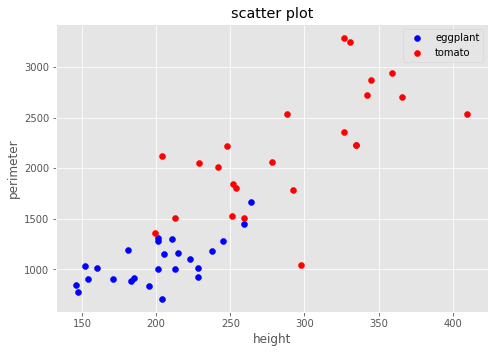

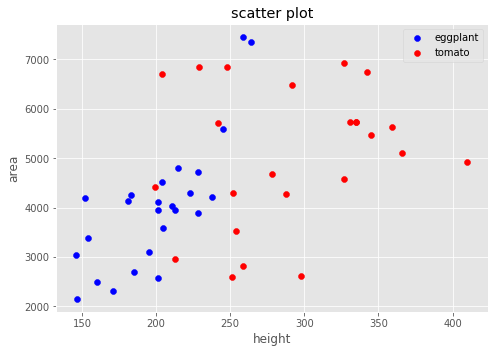

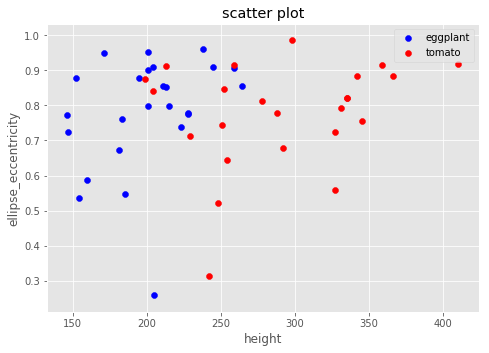

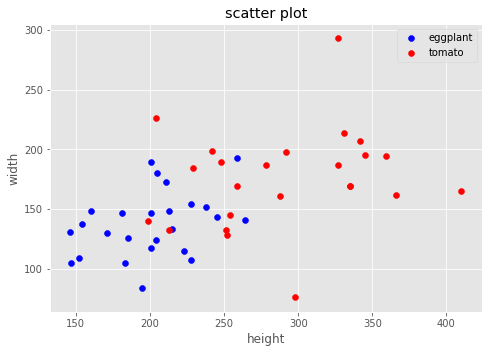

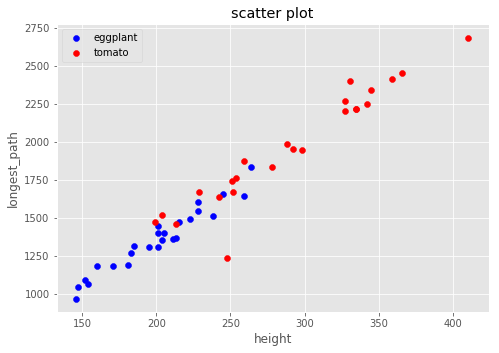

...

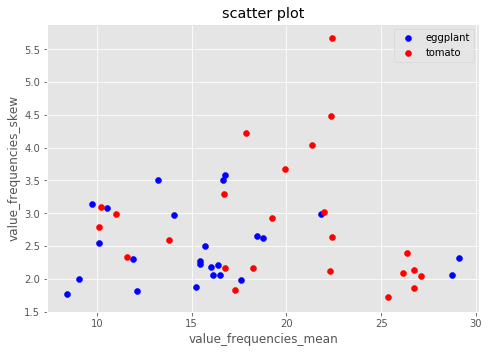

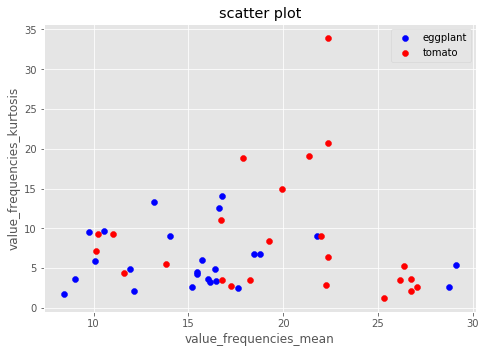

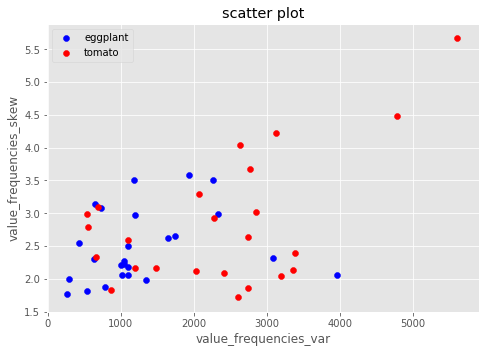

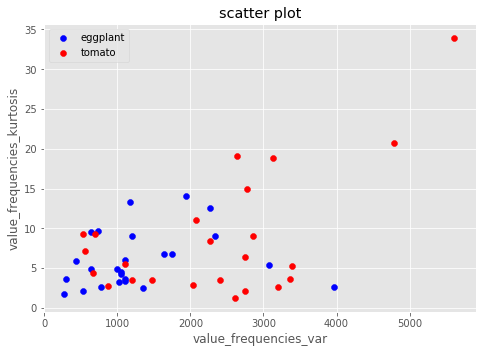

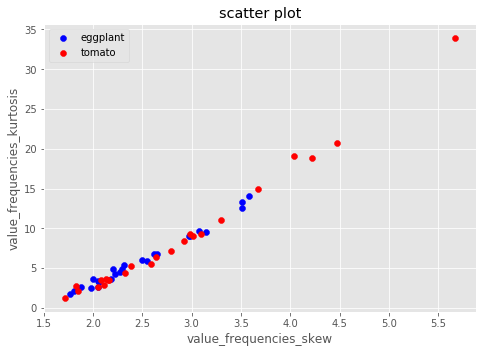

In [96]:
data = pandas.read_csv("C:/Users/Jhilik/Desktop/AICH/sample.csv", names=keep_col)

for y in range(len(keep_col)):
    for x in range(y+1,len(keep_col)):
        egg = []
        egg1 = []
        tom = []
        tom1 = []
        for i in range(1,50):
            if i<26:
                egg.append(float(data.iat[i,y]))
                egg1.append(float(data.iat[i,x]))
            else:
                tom.append(float(data.iat[i,y]))
                tom1.append(float(data.iat[i,x]))

        fig=plt.figure()
        classes = ['eggplant','tomato']
        ax=fig.add_axes([0,0,1,1])
        ax.scatter(egg, egg1, color='b')
        ax.scatter(tom, tom1, color='r')
        ax.set_xlabel(str(data.iat[0,y]))
        ax.set_ylabel(str(data.iat[0,x]))
        ax.set_title('scatter plot')
        ax.legend(labels=classes)
        plt.show()
        


In [170]:
f=pd.read_csv("C:/Users/Jhilik/Desktop/AICH/sample.csv")
keep_col = ['perimeter','width','longest_path','hue_circular_std','solidity','ellipse_angle','convex_hull_area','ellipse_major_axis','convex_hull_vertices','blue_frequencies_var','blue_frequencies_skew','red_frequencies_var','red_frequencies_skew','lightness_frequencies_var','lightness_frequencies_skew','green_frequencies_mean','green_frequencies_skew','value_frequencies_skew']
new_f = f[keep_col]
new_f.to_csv("C:/Users/Jhilik/Desktop/AICH/ml.csv", index=False)  



[[2.41103067e+03 1.92666667e+02 2.06477778e+03 1.39000000e+02
  1.57028706e-01 7.92301318e+01 3.66974167e+04 2.98649629e+02
  1.66111111e+01 3.61624027e+03 3.26899168e+00 4.46237872e+03
  3.58515832e+00 2.99069383e+03 3.31863526e+00 2.19036458e+01
  2.96418425e+00 2.96833826e+00]
 [1.16642634e+03 1.35187500e+02 1.42268750e+03 1.47250000e+02
  2.62822427e-01 8.39239059e+01 1.53470781e+04 3.61293850e+02
  1.60625000e+01 1.67372930e+03 3.02138668e+00 2.16052105e+03
  3.68692733e+00 1.19017461e+03 2.73286547e+00 1.51188965e+01
  2.48999455e+00 2.49100648e+00]]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 1 0 1 1 0 1 0 1]


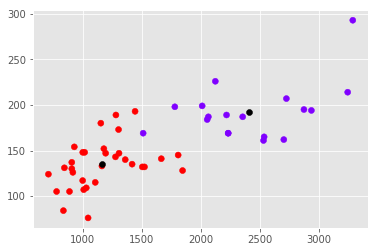

In [183]:
from sklearn.cluster import KMeans

df = pandas.read_csv("C:/Users/Jhilik/Desktop/AICH/ml.csv", names=keep_col)

dataset_array = array(df.values)[1:]
dataset_array.astype('float64') 

kmeans = KMeans(n_clusters=2)
kmeans.fit(dataset_array)

print(kmeans.cluster_centers_)
print(kmeans.labels_)

X = []
Y = []
for i in range(1,51):
    X.append(float(df.iat[i,0]))
    Y.append(float(df.iat[i,1]))

plt.scatter(X,Y, c=kmeans.labels_, cmap='rainbow')
plt.scatter(kmeans.cluster_centers_[:,0] ,kmeans.cluster_centers_[:,1], color='black')


In [1]:
df = pandas.read_csv("C:/Users/Jhilik/Desktop/AICH/ml.csv")
y = array(df.iloc[:,-1:])
x = array(df.iloc[:,:-1])
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
from sklearn.svm import SVC
svclassifier = SVC(kernel='linear',degree=2)
svclassifier.fit(X_train,y_train)
y_pred = svclassifier.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test,y_pred))

NameError: name 'pandas' is not defined

In [22]:
import pickle
pickle.dump(svclassifier,open('C:/Users/Jhilik/Desktop/AICH/mlmodel.sav','wb'))
model = pickle.load(open('C:/Users/Jhilik/Desktop/AICH/mlmodel.sav','rb'))
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
y_pred = model.predict(X_test)

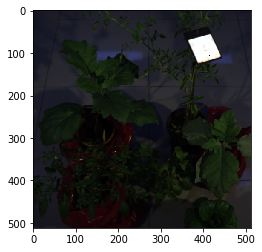

This function has been updated to include object hierarchy so object holes can be included


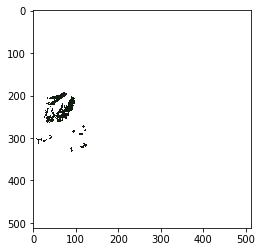

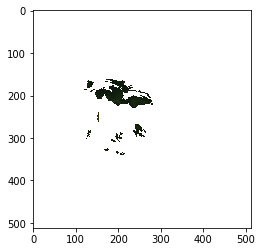

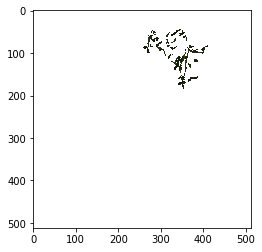

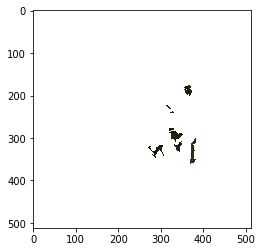

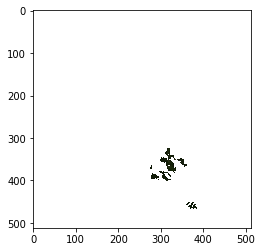

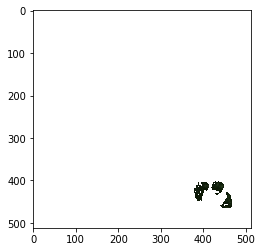

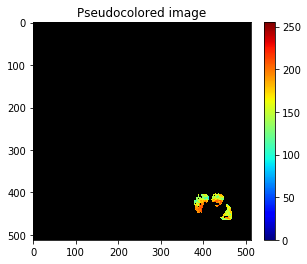